### **Import necessary libs for Airbus Ship Detection Challenge**

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from skimage.io import imread

### **Print the names of all folders provided for solving the Challenge**

In [3]:
print(os.listdir("/kaggle/input/airbus-ship-detection"))

['test_v2', 'sample_submission_v2.csv', 'train_ship_segmentations_v2.csv', 'train_v2']


In [4]:
train_image_path = "/kaggle/input/airbus-ship-detection/train_v2/"

In [5]:
train = pd.read_csv('/kaggle/input/airbus-ship-detection/train_ship_segmentations_v2.csv')

In [6]:
train.head(20)

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...
8,0001b1832.jpg,NaN
9,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...


### **From the first 20 elements, we conclude that where there is NaN, it means that there is no ship in the picture, otherwise the ship exists in the picture**

### **Look at 20 images with ships**

In [7]:
def plot_sample_images_with_masks_or_background(sample):
    fig, ax = plt.subplots(5, 4, sharex='col', sharey='row')
    fig.set_size_inches(25, 25)

    for i, imgid in enumerate(sample.ImageId):
        col = i % 4
        row = i // 4

        path = Path(train_image_path) / '{}'.format(imgid)
        img = imread(path)

        ax[row, col].imshow(img)
        ax[row, col].set_title(imgid)

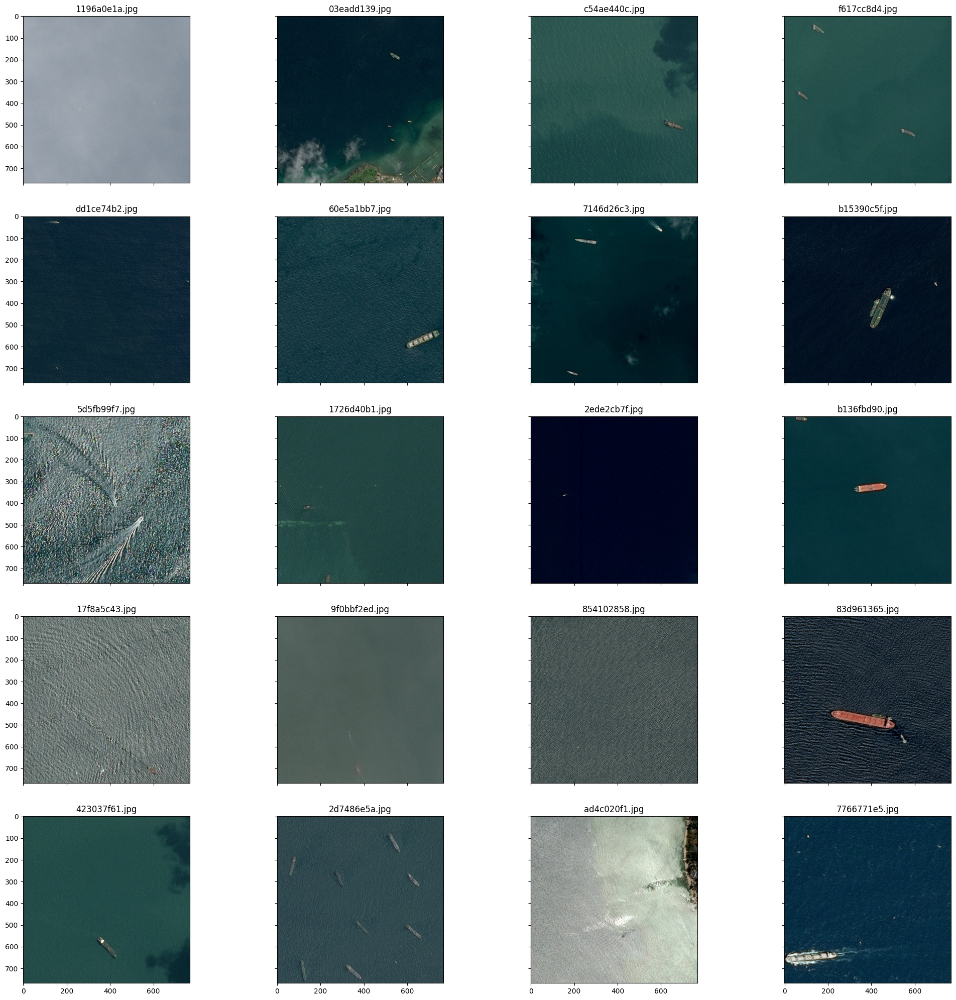

In [8]:
sample_with_ships  = train[~train.EncodedPixels.isna()].sample(20)

plot_sample_images_with_masks_or_background(sample_with_ships)

### **Look at 20 images without ships**

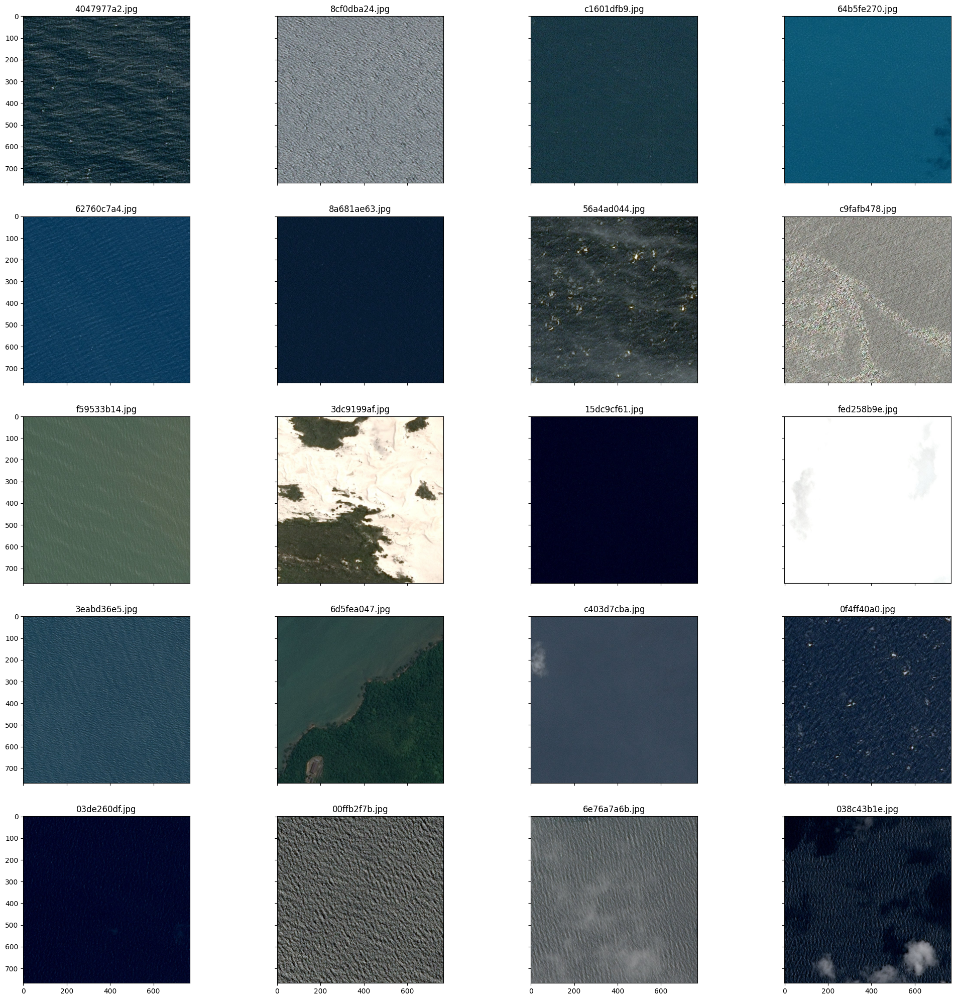

In [9]:
sample_wihtout_ships = train[train.EncodedPixels.isna()].sample(20)

plot_sample_images_with_masks_or_background(sample_wihtout_ships)

### **Look at class balance for all data**

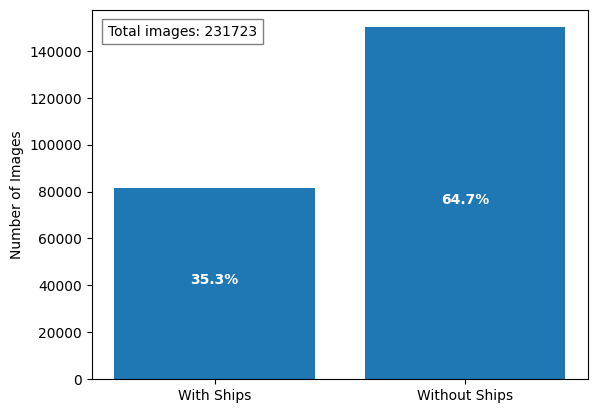

In [10]:
with_ships = train[~train.EncodedPixels.isna()]
without_ships = train[train.EncodedPixels.isna()]

totals = [len(with_ships), len(without_ships)]

plt.text(0.15, 0.82, f'Total images: {sum(totals)}', ha='left', 
         va='bottom', color='black', bbox=dict(facecolor='white', alpha=0.5),
         transform=plt.gcf().transFigure)

for i, total in enumerate(totals):
    percentage = f'{total/sum(totals)*100:.1f}%'
    plt.text(i, total/2, percentage, ha='center', color='white', fontweight='bold')

plt.bar(['With Ships', 'Without Ships'], [len(with_ships), len(without_ships)]);
plt.ylabel('Number of Images');

### **Look at class balance for unique data**

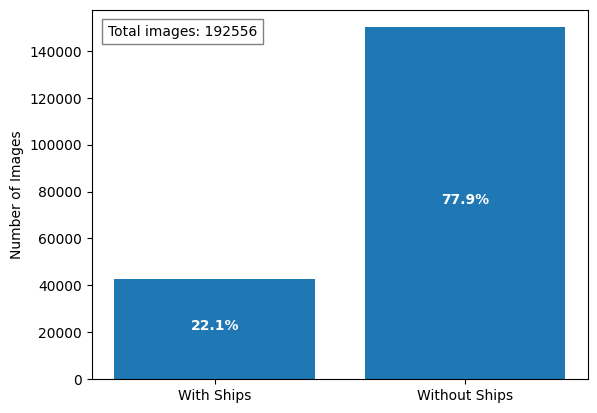

In [11]:
with_ships = train[~train.EncodedPixels.isna()].ImageId.unique()
without_ships = train[train.EncodedPixels.isna()].ImageId.unique()

totals = [len(with_ships), len(without_ships)]

plt.text(0.15, 0.82, f'Total images: {sum(totals)}', ha='left', 
         va='bottom', color='black', bbox=dict(facecolor='white', alpha=0.5),
         transform=plt.gcf().transFigure)

for i, total in enumerate(totals):
    percentage = f'{total/sum(totals)*100:.1f}%'
    plt.text(i, total/2, percentage, ha='center', color='white', fontweight='bold')

plt.bar(['With Ships', 'Without Ships'], [len(with_ships), len(without_ships)]);
plt.ylabel('Number of Images');

### **Look at colour distributions between images with ships and those without**
Lets look at 500 of each, sampled at random

In [12]:
def get_img(imgid):
    path = Path(train_image_path) / '{}'.format(imgid)
    return imread(path)

In [13]:
def plot_of_color_distribution_in_images(mask):
    fig, ax = plt.subplots(1, 2, sharex='col', sharey='row')
    fig.set_size_inches(25, 10)

    for i, (msk, label) in enumerate(zip([mask, ~mask], ['Without Ships', 'With Ships'])):
        _ids = train[msk].ImageId.sample(500)
        imgs = np.array([get_img(_id) for _id in _ids])
        
        red = imgs[:, :, :, 0]
        green = imgs[:, :, :, 1]
        blue = imgs[:, :, :, 2]

        ax[i].plot(np.bincount(red.ravel()), color='red', label='red', lw=2)
        ax[i].plot(np.bincount(green.ravel()), color='green', label='green', lw=2)
        ax[i].plot(np.bincount(blue.ravel()), color='blue', label='blue', lw=2)
        ax[i].title.set_text(label)
        ax[i].title.set_size(20)

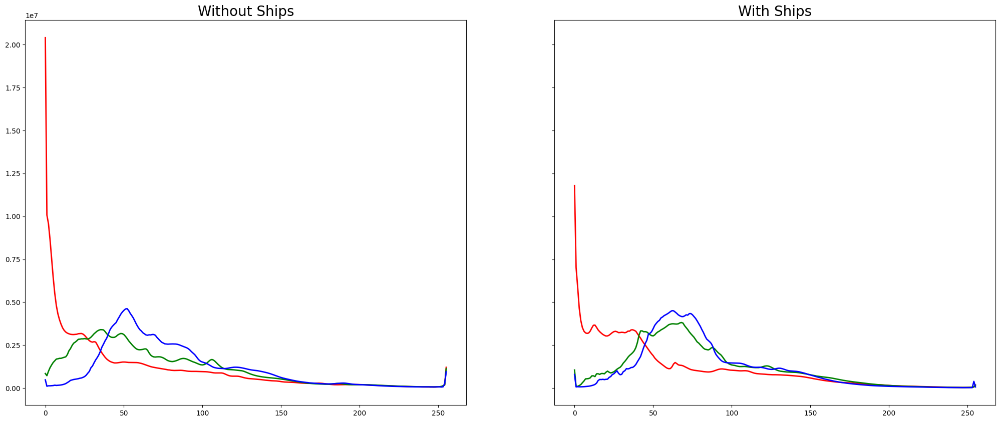

In [14]:
mask = train.EncodedPixels.isna()

plot_of_color_distribution_in_images(mask)

### **Look at colour distributions of areas with no ships and ships themselves**

In [15]:
# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_decode(mask_rle, shape=(768, 768)):
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to align to RLE direction

In [16]:
def apply_masks_to_img(img, _id, df):
    masks = df[df.ImageId == _id].EncodedPixels.apply(lambda x: rle_decode(x)).tolist()
    masks = sum(masks)
    return img * masks.reshape(img.shape[0], img.shape[1], 1)

In [17]:
def plot_of_color_distribution_in_images_applying_segmentation(mask):
    fig, ax = plt.subplots(1, 2, sharex='col')
    fig.set_size_inches(25, 10)
    
    for i, (msk, label) in enumerate(zip([mask, ~mask], ['Without Ships', 'Only Ships(Using training segmentation)'])):
        _ids = train[msk].ImageId.sample(500)
        imgs = [get_img(_id) for _id in _ids]

        # if we have an encoding to decode
        if i == 1:
            imgs = [apply_masks_to_img(i, _id, train) for (i, _id) in zip(imgs, _ids)]

        imgs = np.array(imgs)
        red = imgs[:, :, :, 0]
        green = imgs[:, :, :, 1]
        blue = imgs[:, :, :, 2]

        ax[i].plot(np.bincount(red.ravel())[1:], color='red', label='red', lw=2)
        ax[i].plot(np.bincount(green.ravel())[1:], color='green', label='green', lw=2)
        ax[i].plot(np.bincount(blue.ravel())[1:], color='blue', label='blue', lw=2)
        ax[i].title.set_text(label)

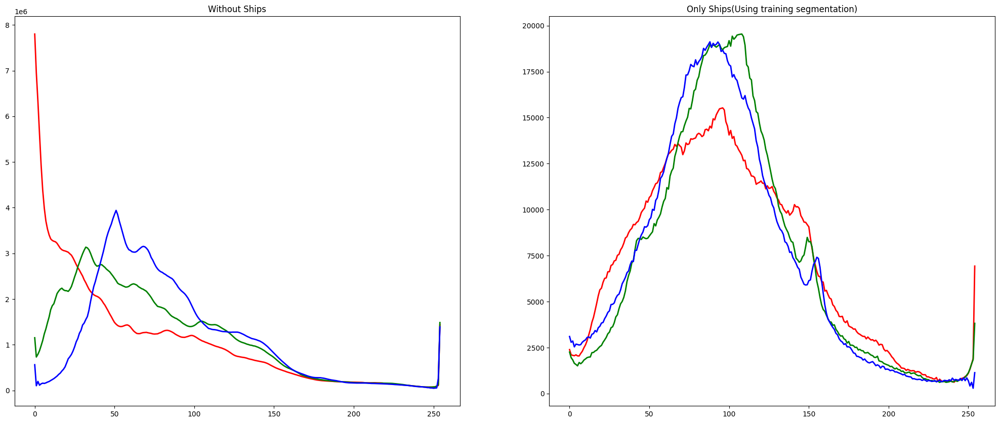

In [18]:
mask = train.EncodedPixels.isna()

plot_of_color_distribution_in_images_applying_segmentation(mask)